In [1]:
import os

import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from pandas.plotting import lag_plot
from pandas.tools.plotting import autocorrelation_plot

import pickle
import quandl
from datetime import datetime


import math
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.tsa.stattools as ts




import statsmodels.api as sm

import scipy.stats as ss

import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)

from quandl.errors.quandl_error import NotFoundError



import sklearn as sk
from sklearn import preprocessing as pr
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

import matplotlib.patches as mpatches
from scipy.signal import correlate
from scipy.stats.mstats import spearmanr
from statsmodels.tsa.stattools import acf, adfuller
from statsmodels.graphics.tsaplots import plot_pacf

import seaborn as sns
from datetime import datetime, timedelta

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

from scipy import stats
import statsmodels.api as sm
from itertools import product

import warnings
warnings.filterwarnings('ignore')

from statsmodels.tsa.stattools import adfuller

import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs


import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

import itertools
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['text.color'] = 'k'

#import matplotlib.pyplot as plt
#import numpy as np
#import pandas as pd

In [2]:
'''Retrieve Bitcoin Pricing data using Quandl'''

def get_quandl_data(quandl_id):
    '''Download and cache Quandl dataseries'''
    cache_path = '{}.pkl'.format(quandl_id).replace('/','-')
    try:
        f = open(cache_path, 'rb')
        df = pickle.load(f)   
        print('Loaded {} from cache'.format(quandl_id))
    except (OSError, IOError) as e:
        print('Downloading {} from Quandl'.format(quandl_id))
        df = quandl.get(quandl_id, returns="pandas")
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(quandl_id, cache_path))
    return df

In [3]:
'''Pull kraken exchange pricing data'''

quandl_api_key = "sWmNm41Ji9goVFUtnUxe"
quandl.ApiConfig.api_key = quandl_api_key
btc_usd_price_kraken = get_quandl_data('BCHARTS/KRAKENUSD')

Loaded BCHARTS/KRAKENUSD from cache


In [4]:
btc_usd_price_kraken.head()

,Open,High,Low,Close,Volume (BTC),Volume (Currency),Weighted Price
Date,,,,,,,
2014-01-07,874.67040,892.06753,810.00000,810.00000,15.622378,13151.472844,841.835522
2014-01-08,810.00000,899.84281,788.00000,824.98287,19.182756,16097.329584,839.156269
2014-01-09,825.56345,870.00000,807.42084,841.86934,8.158335,6784.249982,831.572913
2014-01-10,839.99000,857.34056,817.00000,857.33056,8.024510,6780.220188,844.938794
2014-01-11,858.20000,918.05471,857.16554,899.84105,18.748285,16698.566929,890.671709


In [5]:
'''Plotting the BTC kraken pricing data'''

btc_trace = go.Scatter(x=btc_usd_price_kraken.index, y=btc_usd_price_kraken['Weighted Price'])
py.iplot([btc_trace])

In [6]:
'''Pull pricing data for 3 more BTC exchanges'''

try:
    exchanges = ['COINBASE','BITSTAMP','ITBIT']

    exchange_data = {}

    exchange_data['KRAKEN'] = btc_usd_price_kraken

    for exchange in exchanges:
        exchange_code = 'BCHARTS/{}USD'.format(exchange)
        btc_exchange_df = get_quandl_data(exchange_code)
        exchange_data[exchange] = btc_exchange_df
    
except NotFoundError as e:
         print('error: {} '.format(str(e)))

Loaded BCHARTS/COINBASEUSD from cache
Loaded BCHARTS/BITSTAMPUSD from cache
Loaded BCHARTS/ITBITUSD from cache


In [7]:
def merge_dfs_on_column(dataframes, labels, col):
    '''Merge a single column of each dataframe into a new combined dataframe'''
    series_dict = {}
    for index in range(len(dataframes)):
        series_dict[labels[index]] = dataframes[index][col]
        
    return pd.DataFrame(series_dict)

In [8]:
'''Merge the BTC price dataseries' into a single dataframe'''
btc_usd_datasets = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Weighted Price')

In [9]:
'''Previewing the last 5 rows'''
btc_usd_datasets.tail()

,KRAKEN,COINBASE,BITSTAMP,ITBIT
Date,,,,
2018-09-16,6463.753311,6463.503207,6456.389531,6465.736285
2018-09-17,6335.470383,6352.904890,6323.180216,6283.055160
2018-09-18,6306.223215,6306.788616,6305.513155,6307.623402
2018-09-19,6344.751761,6340.783998,6329.133068,6334.001018
2018-09-20,6402.268693,6397.008433,6400.597781,6400.345052


In [10]:
'''The prices look to be as expected: they are in similar ranges, but with slight variations based on the supply and demand of each individual Bitcoin exchange.'''

'''Visualizing the pricing datasets.'''

def df_scatter(df, title, seperate_y_axis=False, y_axis_label='', scale='linear', initial_hide=False):
    '''Generate a scatter plot of the entire dataframe'''
    label_arr = list(df)
    series_arr = list(map(lambda col: df[col], label_arr))
    
    layout = go.Layout(
        title=title,
        legend=dict(orientation="h"),
        xaxis=dict(type='date'),
        yaxis=dict(
            title=y_axis_label,
            showticklabels= not seperate_y_axis,
            type=scale
        )
    )
    
    y_axis_config = dict(
        overlaying='y',
        showticklabels=False,
        type=scale )
    
    visibility = 'visible'
    if initial_hide:
        visibility = 'legendonly'
        
    # Form Trace For Each Series
    trace_arr = []
    for index, series in enumerate(series_arr):
        trace = go.Scatter(
            x=series.index, 
            y=series, 
            name=label_arr[index],
            #visible=visibility
        )
        
        # Add seperate axis for the series
        if seperate_y_axis:
            trace['yaxis'] = 'y{}'.format(index + 1)
            layout['yaxis{}'.format(index + 1)] = y_axis_config    
        trace_arr.append(trace)

    fig = go.Figure(data=trace_arr, layout=layout)
    py.iplot(fig)

In [11]:
df_scatter(btc_usd_datasets, 'Bitcoin Price (USD) By Exchange')

In [12]:
'''Clean and Aggregate the Pricing Data'''

'''Remove all "0" values from dataframe, since BTC price has never been zero.''' 

btc_usd_datasets.replace(0, np.nan, inplace=True)

In [13]:

'''Plot the revised dataframe''' 
df_scatter(btc_usd_datasets, 'Bitcoin Price (USD) By Exchange')

In [14]:
'''Calculate the average BTC price as a new column''' 
btc_usd_datasets['avg_btc_price_usd'] = btc_usd_datasets.mean(axis=1)

In [15]:
'''Plot the average BTC price'''
btc_trace = go.Scatter(x=btc_usd_datasets.index, y=btc_usd_datasets['avg_btc_price_usd'])
py.iplot([btc_trace])

In [16]:
'''Define Poloniex API Helper Functions'''

def get_json_data(json_url, cache_path):
    '''Download and cache JSON data, return as a dataframe.'''
    try:        
        f = open(cache_path, 'rb')
        df = pickle.load(f)   
        print('Loaded {} from cache'.format(json_url))
    except (OSError, IOError) as e:
        print('Downloading {}'.format(json_url))
        df = pd.read_json(json_url)
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(json_url, cache_path))
    return df

In [17]:
'''Generate Poloniex API HTTP requests. Call get_json_data() to save the results.'''

base_polo_url = 'https://poloniex.com/public?command=returnChartData&currencyPair={}&start={}&end={}&period={}'
start_date = datetime.strptime('2015-01-01', '%Y-%m-%d') # get data from the start of 2015
end_date = datetime.now() # up until today
period = 86400 # pull daily data (86,400 seconds per day)

def get_crypto_data(poloniex_pair):
    '''Retrieve cryptocurrency data from poloniex'''
    json_url = base_polo_url.format(poloniex_pair, start_date.timestamp(), end_date.timestamp(), period)
    data_df = get_json_data(json_url, poloniex_pair)
    data_df = data_df.set_index('date')
    return data_df

In [18]:
'''Download Trading Data From Poloniex'''

'''Downloaded exchange data for the top cryptocurrencies -
Ethereum, Litecoin, Ripple, Ethereum Classic, Stellar, Dash, Siacoin, Monero, NEM, and Zcash'''



altcoins = ['ETH','LTC','XRP','ETC','STR','DASH','SC','XMR','XEM', 'ZEC']

altcoin_data = {}
for altcoin in altcoins:
    coinpair = 'BTC_{}'.format(altcoin)
    crypto_price_df = get_crypto_data(coinpair)
    altcoin_data[altcoin] = crypto_price_df

Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_ETH&start=1420041600.0&end=1542693768.198598&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_LTC&start=1420041600.0&end=1542693768.198598&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_XRP&start=1420041600.0&end=1542693768.198598&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_ETC&start=1420041600.0&end=1542693768.198598&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_STR&start=1420041600.0&end=1542693768.198598&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_DASH&start=1420041600.0&end=1542693768.198598&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_SC&start=1420041600.0&end=1542693768.198598&period=86

In [19]:
altcoin_data['ETH'].tail()

,close,high,low,open,quoteVolume,volume,weightedAverage
date,,,,,,,
2018-09-17,0.031329,0.034458,0.030883,0.033900,44574.484151,1463.493520,0.032833
2018-09-18,0.032906,0.033697,0.031123,0.031381,26166.180830,853.666308,0.032625
2018-09-19,0.032812,0.033771,0.032110,0.032946,19260.716295,633.067894,0.032868
2018-09-20,0.034564,0.034895,0.032292,0.032805,31772.436400,1059.166417,0.033336
2018-09-21,0.033925,0.034702,0.033848,0.034579,5950.765887,203.672572,0.034226


In [20]:
'''Convert Prices to USD'''

# Calculate USD Price as a new column in each altcoin dataframe
for altcoin in altcoin_data.keys():
    altcoin_data[altcoin]['price_usd'] =  altcoin_data[altcoin]['weightedAverage'] * btc_usd_datasets['avg_btc_price_usd']

In [21]:
# Merge USD price of each altcoin into single dataframe 
combined_df = merge_dfs_on_column(list(altcoin_data.values()), list(altcoin_data.keys()), 'price_usd')

In [22]:
# Add BTC price to the dataframe
combined_df['BTC'] = btc_usd_datasets['avg_btc_price_usd']

In [23]:
# Chart all of the altocoin prices
df_scatter(combined_df, 'Cryptocurrency Prices (USD)', seperate_y_axis=False, y_axis_label='Coin Value (USD)', scale='log')

In [24]:


df1 = pd.read_csv('C:\\Users\\ShiviMalhotra\\Desktop\\research material\\cryptocompare_BTC.csv') 

In [25]:
btc_trace = go.Scatter(x=df1['timeDate'], y=df1['volumefrom'])
py.iplot([btc_trace])

In [26]:
'''correlation hypothesis using the Pandas corr() method, which computes a Pearson correlation coefficient for each column in the dataframe against each other column'''

# Calculate the pearson correlation coefficients for cryptocurrencies in 2016
combined_df_2016 = combined_df[combined_df.index.year == 2016]
combined_df_2016.pct_change().corr(method='pearson')

,ETH,LTC,XRP,ETC,STR,DASH,SC,XMR,XEM,ZEC,BTC
ETH,1.000000,-0.064652,0.085630,-0.181991,0.035093,0.122695,0.169642,0.087216,0.043205,0.112247,-0.006502
LTC,-0.064652,1.000000,0.053712,-0.131079,0.113523,-0.012194,0.012253,0.129475,0.160667,0.142880,0.750174
XRP,0.085630,0.053712,1.000000,-0.054095,0.320116,0.088657,0.021098,0.027649,0.101326,-0.101774,0.044161
ETC,-0.181991,-0.131079,-0.054095,1.000000,-0.102654,0.003992,-0.008066,-0.105898,-0.080938,0.062003,-0.170538
STR,0.035093,0.113523,0.320116,-0.102654,1.000000,0.058083,0.143252,0.027998,0.225132,-0.001715,0.079075
DASH,0.122695,-0.012194,0.088657,0.003992,0.058083,1.000000,0.026602,0.121537,0.014571,0.040876,-0.014040
SC,0.169642,0.012253,0.021098,-0.008066,0.143252,0.026602,1.000000,0.047910,0.106153,0.020958,0.035116
XMR,0.087216,0.129475,0.027649,-0.105898,0.027998,0.121537,0.047910,1.000000,0.016438,0.106825,0.127520
XEM,0.043205,0.160667,0.101326,-0.080938,0.225132,0.014571,0.106153,0.016438,1.000000,-0.033197,0.227674
ZEC,0.112247,0.142880,-0.101774,0.062003,-0.001715,0.040876,0.020958,0.106825,-0.033197,1.000000,0.199881


In [27]:
'''To help visualize these results, we'll create one more helper visualization function.'''

def correlation_heatmap(df, title, absolute_bounds=True):
    '''Plot a correlation heatmap for the entire dataframe'''
    heatmap = go.Heatmap(
        z=df.corr(method='pearson').as_matrix(),
        x=df.columns,
        y=df.columns,
        colorbar=dict(title='Pearson Coefficient'),
    )
    
    layout = go.Layout(title=title)
    
    if absolute_bounds:
        heatmap['zmax'] = 1.0
        heatmap['zmin'] = -1.0
        
    fig = go.Figure(data=[heatmap], layout=layout)
    py.iplot(fig)

In [28]:
correlation_heatmap(combined_df_2016.pct_change(), "Cryptocurrency Correlations in 2016")

In [29]:
combined_df_2017 = combined_df[combined_df.index.year == 2017]
combined_df_2017.pct_change().corr(method='pearson')

,ETH,LTC,XRP,ETC,STR,DASH,SC,XMR,XEM,ZEC,BTC
ETH,1.000000,0.437609,0.212350,0.601437,0.259399,0.506911,0.373078,0.554632,0.399200,0.539700,0.410771
LTC,0.437609,1.000000,0.323905,0.482062,0.307589,0.340153,0.339144,0.437204,0.379088,0.264172,0.420645
XRP,0.212350,0.323905,1.000000,0.114780,0.509828,0.091146,0.243872,0.226636,0.268168,0.229027,0.131469
ETC,0.601437,0.482062,0.114780,1.000000,0.210387,0.387555,0.298406,0.447398,0.321852,0.410320,0.416562
STR,0.259399,0.307589,0.509828,0.210387,1.000000,0.183038,0.402966,0.327488,0.339502,0.240921,0.230957
DASH,0.506911,0.340153,0.091146,0.387555,0.183038,1.000000,0.291424,0.498418,0.325968,0.543080,0.307095
SC,0.373078,0.339144,0.243872,0.298406,0.402966,0.291424,1.000000,0.378644,0.331350,0.278549,0.325318
XMR,0.554632,0.437204,0.226636,0.447398,0.327488,0.498418,0.378644,1.000000,0.336076,0.461947,0.409183
XEM,0.399200,0.379088,0.268168,0.321852,0.339502,0.325968,0.331350,0.336076,1.000000,0.381487,0.329431
ZEC,0.539700,0.264172,0.229027,0.410320,0.240921,0.543080,0.278549,0.461947,0.381487,1.000000,0.291353


In [30]:
correlation_heatmap(combined_df_2017.pct_change(), "Cryptocurrency Correlations in 2017")

In [31]:
combined_df_2018 = combined_df[combined_df.index.year == 2018]
combined_df_2018.pct_change().corr(method='pearson')

,ETH,LTC,XRP,ETC,STR,DASH,SC,XMR,XEM,ZEC,BTC
ETH,1.000000,0.797863,0.712204,0.776427,0.657478,0.787695,0.693532,0.802587,0.730133,0.767748,0.803179
LTC,0.797863,1.000000,0.702900,0.708430,0.664307,0.797271,0.722501,0.786871,0.666829,0.737075,0.843522
XRP,0.712204,0.702900,1.000000,0.645625,0.803161,0.702354,0.697277,0.691886,0.764867,0.667666,0.727941
ETC,0.776427,0.708430,0.645625,1.000000,0.590772,0.702610,0.591113,0.682553,0.621382,0.678793,0.707390
STR,0.657478,0.664307,0.803161,0.590772,1.000000,0.674269,0.677746,0.677730,0.763769,0.655232,0.719290
DASH,0.787695,0.797271,0.702354,0.702610,0.674269,1.000000,0.702668,0.803379,0.693123,0.778880,0.785745
SC,0.693532,0.722501,0.697277,0.591113,0.677746,0.702668,1.000000,0.691775,0.705628,0.671516,0.738717
XMR,0.802587,0.786871,0.691886,0.682553,0.677730,0.803379,0.691775,1.000000,0.703095,0.773848,0.846020
XEM,0.730133,0.666829,0.764867,0.621382,0.763769,0.693123,0.705628,0.703095,1.000000,0.647203,0.723909
ZEC,0.767748,0.737075,0.667666,0.678793,0.655232,0.778880,0.671516,0.773848,0.647203,1.000000,0.745161


In [32]:
correlation_heatmap(combined_df_2018.pct_change(), "Cryptocurrency Correlations in 2018")

In [33]:
base_polo_url = 'https://bitcoinchain.com/markets/btcusd-okcoin'
start_date = datetime.strptime('2015-01-01', '%Y-%m-%d') # get data from the start of 2015
end_date = datetime.now() # up until today
period = 86400 # pull daily data (86,400 seconds per day)

# Helper function to download and cache JSON data; returns a DF
def get_json_data(json_url, cache_path):
    try:        
        with open(cache_path, 'rb') as f:
            df = pickle.load(f)   
            print('Loaded {} from cache'.format(json_url))
    except (OSError, IOError) as e:
        print('Downloading {}'.format(json_url))
        df = pd.read_json(json_url)
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(json_url, cache_path))
    return df

# Retrieve cryptocurrency data from Poloniex
def get_crypto_data(poloniex_pair):
    json_url = base_polo_url.format(poloniex_pair, start_date.timestamp(), end_date.timestamp(), period)
    data_df = get_json_data(json_url, poloniex_pair)
    data_df = data_df.set_index('date')
    return data_df

coinpair = 'BTC_{}'.format('ETH')
df = get_crypto_data(coinpair)
df.tail()

Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache


,close,high,low,open,quoteVolume,volume,weightedAverage
date,,,,,,,
2018-09-17,0.031329,0.034458,0.030883,0.033900,44574.484151,1463.493520,0.032833
2018-09-18,0.032906,0.033697,0.031123,0.031381,26166.180830,853.666308,0.032625
2018-09-19,0.032812,0.033771,0.032110,0.032946,19260.716295,633.067894,0.032868
2018-09-20,0.034564,0.034895,0.032292,0.032805,31772.436400,1059.166417,0.033336
2018-09-21,0.033925,0.034702,0.033848,0.034579,5950.765887,203.672572,0.034226


In [34]:
altcoins = ['ETH','LTC','XRP','ETC','STR','DASH','SC','XMR','XEM']

altcoin_data = {}
for altcoin in altcoins:
    coinpair = 'BTC_{}'.format(altcoin)
    crypto_price_df = get_crypto_data(coinpair)
    altcoin_data[altcoin] = crypto_price_df

Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache


In [35]:
altcoin_data['ETH'].tail(3)

,close,high,low,open,quoteVolume,volume,weightedAverage
date,,,,,,,
2018-09-19,0.032812,0.033771,0.032110,0.032946,19260.716295,633.067894,0.032868
2018-09-20,0.034564,0.034895,0.032292,0.032805,31772.436400,1059.166417,0.033336
2018-09-21,0.033925,0.034702,0.033848,0.034579,5950.765887,203.672572,0.034226


In [36]:
altcoin_data['LTC'].tail(3)

,close,high,low,open,quoteVolume,volume,weightedAverage
date,,,,,,,
2018-09-19,0.008510,0.008620,0.008311,0.008520,10220.869503,86.455763,0.008459
2018-09-20,0.008706,0.008808,0.008347,0.008508,10774.233214,92.057037,0.008544
2018-09-21,0.008692,0.008791,0.008675,0.008709,3460.015087,30.150025,0.008714


In [37]:
import quandl
import pickle
from pandas import DataFrame


# Define a helper function to download and cache datasets from Quandl
def get_quandl_data(quandl_id):
    cache_path = '{}.pkl'.format(quandl_id).replace('/','-')
    try:
        with open(cache_path, 'rb') as f:
            df = pickle.load(f)   
            print('Loaded {} from cache'.format(quandl_id))
    except (OSError, IOError) as e:
        print('Downloading {} from Quandl'.format(quandl_id))
        df = quandl.get(quandl_id, returns='pandas')
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(quandl_id, cache_path))
    return df

# Retrieve Bitcoin data from several exchanges
exchanges = ['COINBASE', 'KRAKEN', 'BITSTAMP','ITBIT']
exchange_data = {}
for exchange in exchanges:
    exchange_code = 'BCHARTS/{}USD'.format(exchange)
    df = get_quandl_data(exchange_code)
    exchange_data[exchange] = df
    

# Helper function to merge a single column of each DF into a new combined DF
def merge_dfs_on_column(dataframes, labels, col):
    d = {labels[i]:dataframes[i][col] for i in range(len(dataframes))}       
    return DataFrame(d)
    
# Merge the BTC prices into a single DF
# Note that we'll only use the "Weighted Price" column
btc_usd_datasets = merge_dfs_on_column(dataframes=list(exchange_data.values()), 
                                       labels=list(exchange_data.keys()), 
                                       col='Weighted Price')

# Show the last 10 rows of Bitcoin prices
btc_usd_datasets.tail(10)

Loaded BCHARTS/COINBASEUSD from cache
Loaded BCHARTS/KRAKENUSD from cache
Loaded BCHARTS/BITSTAMPUSD from cache
Loaded BCHARTS/ITBITUSD from cache


,COINBASE,KRAKEN,BITSTAMP,ITBIT
Date,,,,
2018-09-11,6278.697291,6279.709928,6284.683155,6282.415427
2018-09-12,6273.257514,6278.397725,6267.795821,6268.275606
2018-09-13,6450.296453,6477.539409,6460.090136,6452.828573
2018-09-14,6495.983961,6502.085248,6492.115618,6490.428834
2018-09-15,6521.556675,6516.699234,6518.938313,6520.859442
2018-09-16,6463.503207,6463.753311,6456.389531,6465.736285
2018-09-17,6352.904890,6335.470383,6323.180216,6283.055160
2018-09-18,6306.788616,6306.223215,6305.513155,6307.623402
2018-09-19,6340.783998,6344.751761,6329.133068,6334.001018


In [38]:
btc_usd_datasets['avg_btc_price_usd'] = btc_usd_datasets.mean(axis=1)
btc_usd_datasets.tail(10)

,COINBASE,KRAKEN,BITSTAMP,ITBIT,avg_btc_price_usd
Date,,,,,
2018-09-11,6278.697291,6279.709928,6284.683155,6282.415427,6281.376450
2018-09-12,6273.257514,6278.397725,6267.795821,6268.275606,6271.931666
2018-09-13,6450.296453,6477.539409,6460.090136,6452.828573,6460.188643
2018-09-14,6495.983961,6502.085248,6492.115618,6490.428834,6495.153415
2018-09-15,6521.556675,6516.699234,6518.938313,6520.859442,6519.513416
2018-09-16,6463.503207,6463.753311,6456.389531,6465.736285,6462.345584
2018-09-17,6352.904890,6335.470383,6323.180216,6283.055160,6323.652662
2018-09-18,6306.788616,6306.223215,6305.513155,6307.623402,6306.537097
2018-09-19,6340.783998,6344.751761,6329.133068,6334.001018,6337.167461


In [39]:
df_scatter(btc_usd_datasets, 'Bitcoin Price (USD) By Exchange')

In [40]:
# Calculate the pearson correlation coefficients for cryptocurrencies in 2013
combined_df_2015 = combined_df[combined_df.index.year == 2015]
combined_df_2015.pct_change().corr(method='pearson')

,ETH,LTC,XRP,ETC,STR,DASH,SC,XMR,XEM,ZEC,BTC
ETH,1.000000,0.125556,-0.025099,NaN,-0.022020,0.077725,-0.034185,0.012600,0.010292,NaN,0.106961
LTC,0.125556,1.000000,0.194178,NaN,0.237944,0.233996,0.074814,0.283955,0.097358,NaN,0.555553
XRP,-0.025099,0.194178,1.000000,NaN,0.460662,0.198138,0.021157,0.105446,0.116877,NaN,0.263449
ETC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STR,-0.022020,0.237944,0.460662,NaN,1.000000,0.254583,0.112481,0.239343,0.166986,NaN,0.391926
DASH,0.077725,0.233996,0.198138,NaN,0.254583,1.000000,0.064402,0.221629,0.163953,NaN,0.467823
SC,-0.034185,0.074814,0.021157,NaN,0.112481,0.064402,1.000000,0.109674,0.061307,NaN,0.159369
XMR,0.012600,0.283955,0.105446,NaN,0.239343,0.221629,0.109674,1.000000,-0.011538,NaN,0.501417
XEM,0.010292,0.097358,0.116877,NaN,0.166986,0.163953,0.061307,-0.011538,1.000000,NaN,0.125044
ZEC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
def autocorr(x, twosided=False, tapered=True):
    """
    Return (lags, ac), where ac is the estimated autocorrelation 
    function for x, at the full set of possible lags.
    
    If twosided is True, all lags will be included;
    otherwise (default), only non-negative lags will be included.

    If tapered is True (default), the low-MSE estimate, linearly
    tapered to zero for large lags, is returned.
    """
    nx = len(x)
    xdm = x - x.mean()
    ac = np.correlate(xdm, xdm, mode='full')
    ac /= ac[nx - 1]
    lags = np.arange(-nx + 1, nx)
    if not tapered:  # undo the built-in taper
        taper = 1 - np.abs(lags) / float(nx)
        ac /= taper
    if twosided:
        return lags, ac
    else:
        return lags[nx-1:], ac[nx-1:]

max correlation is at lag 29


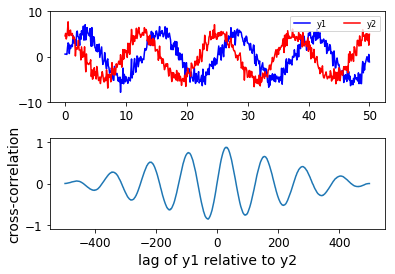

In [42]:
npts = 500
x = np.linspace(0, 50, npts)
y1 = 5 * np.sin(x/2) + np.random.randn(npts)
y2 = 5 * np.cos(x/2) + np.random.randn(npts)

lags = np.arange(-npts + 1, npts)
ccov = np.correlate(y1 - y1.mean(), y2 - y2.mean(), mode='full')
ccor = ccov / (npts * y1.std() * y2.std())

fig, axs = plt.subplots(nrows=2)
fig.subplots_adjust(hspace=0.4)
ax = axs[0]
ax.plot(x, y1, 'b', label='y1')
ax.plot(x, y2, 'r', label='y2')
ax.set_ylim(-10, 10)
ax.legend(loc='upper right', fontsize='small', ncol=2)

ax = axs[1]
ax.plot(lags, ccor)
ax.set_ylim(-1.1, 1.1)
ax.set_ylabel('cross-correlation')
ax.set_xlabel('lag of y1 relative to y2')

maxlag = lags[np.argmax(ccor)]
print("max correlation is at lag %d" % maxlag)

standard deviations:  0.9680781079105649 0.8486210956710137


Text(0,0.5,'autocorrelation')

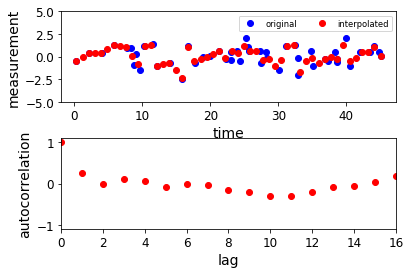

In [43]:
nt = 50
t = 2 * np.random.rand(50).cumsum()
x = np.random.randn(nt)

# Make a uniform grid, with the same number of points:
tnew = np.linspace(t.min(), t.max(), nt)
xnew = np.interp(tnew, t, x)

print("standard deviations: ", x.std(), xnew.std())

fig, (ax0, ax1) = plt.subplots(2)
fig.subplots_adjust(hspace=0.4)
ax0.plot(t, x, 'bo', label='original') 
ax0.plot(tnew, xnew, 'ro', label='interpolated')
ax0.set_xlabel('time')
ax0.set_ylabel('measurement')
ax0.legend(loc='upper right', ncol=2, fontsize='small')
ax0.set_ylim(-5, 5)

lags, auto_x = autocorr(xnew)
ax1.plot(lags, auto_x, 'ro')

for ax in (ax0, ax1):
    ax.locator_params(axis='y', nbins=4)

ax1.set_xlim(0, nt//3) # To see the smaller lags better.
ax1.set_ylim(-1.1, 1.1)
ax1.set_xlabel('lag')
ax1.set_ylabel('autocorrelation')

Text(0,0.5,'ETH % Return')

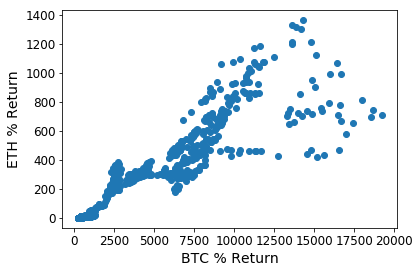

In [44]:
plt.scatter(combined_df['BTC'],combined_df['ETH'])
plt.xlabel('BTC % Return')
plt.ylabel('ETH % Return')

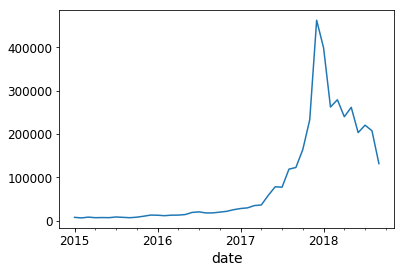

In [45]:
monthly=combined_df['BTC'].resample('M').sum()
monthly.plot( )

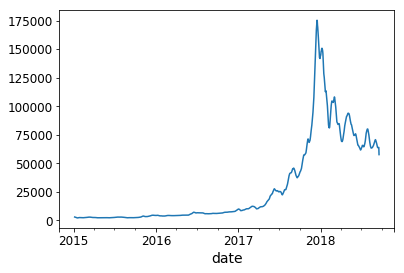

In [46]:
daily=combined_df['BTC'].resample('D').sum()
daily.rolling(10, center=True).sum().plot( )

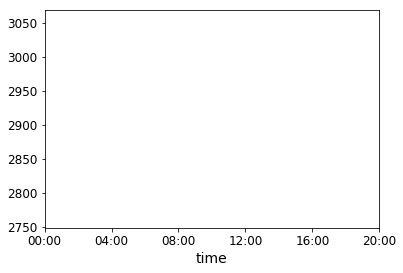

In [47]:
'''hourly time stamp'''

by_time=combined_df['BTC'].groupby(combined_df['BTC'].index.time).mean()
hourly_ticks= 4 * 60 * 60 * np.arange(6)
by_time.plot(xticks=hourly_ticks, style=[':','--','-'])

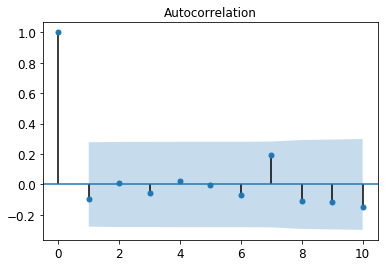

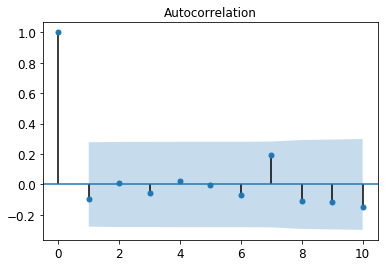

In [48]:
plot_acf(x, lags= 10, alpha=0.05)

#Blue area: confidence interval of ACF


#alpha sets the width of the confidence intrerval, eg: alpha=0.05 means 5% chance that if true autocorrelation is zero, it will fall outside blue band

In [49]:
#Numerical values of ACF

print(acf(x))

[ 1.00000000e+00 -9.64315485e-02  1.24715137e-02 -5.46222212e-02
  2.08739182e-02 -4.54826330e-03 -7.05313287e-02  1.92628364e-01
 -1.09047698e-01 -1.14680599e-01 -1.45604925e-01 -1.03040006e-01
 -1.75639602e-01 -1.35016904e-01 -3.80121087e-02  1.06452217e-01
 -3.75210687e-02 -8.87176214e-02  5.79530493e-02  4.59317163e-02
 -1.91897856e-02 -6.25785525e-03  2.49164313e-01  1.41196600e-01
  8.67698314e-02 -4.34667773e-02  5.06164832e-04 -2.51765344e-02
 -3.72509651e-02  1.86697356e-01 -1.32460978e-01  7.19691108e-02
 -1.65356681e-01  4.67909125e-02 -1.04644918e-01 -1.07170495e-01
  1.25641574e-02 -3.65469744e-02  6.10708767e-02 -2.64308834e-02
 -2.91561761e-04]


In [50]:
def tsplot(y, lags=None, figsize=(10, 8), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        #mpl.rcParams['font.family'] = 'Ubuntu Mono'
        layout = (3, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        qq_ax = plt.subplot2grid(layout, (2, 0))
        pp_ax = plt.subplot2grid(layout, (2, 1))
        
        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analysis Plots')
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)
        sm.qqplot(y, line='s', ax=qq_ax)
        qq_ax.set_title('QQ Plot')        
        scs.probplot(y, sparams=(y.mean(), y.std()), plot=pp_ax)

        plt.tight_layout()
    return 

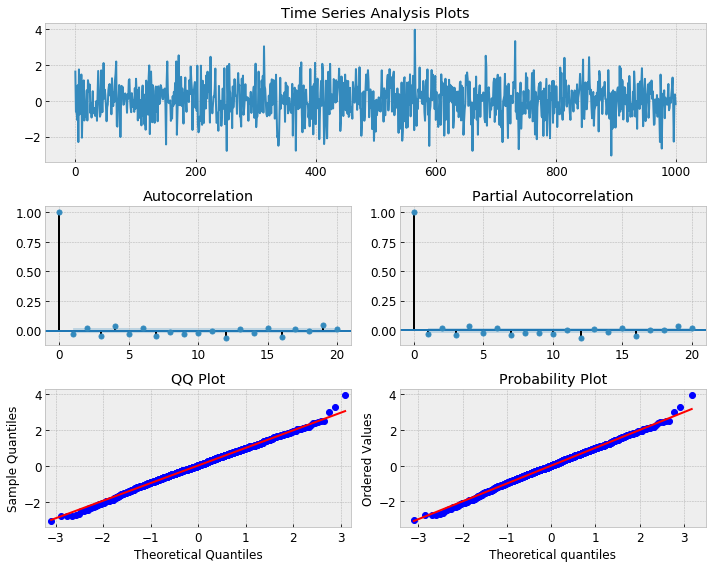

In [51]:
np.random.seed(1)

# plot of discrete white noise
randser = np.random.normal(size=1000)
tsplot(randser, lags=20)

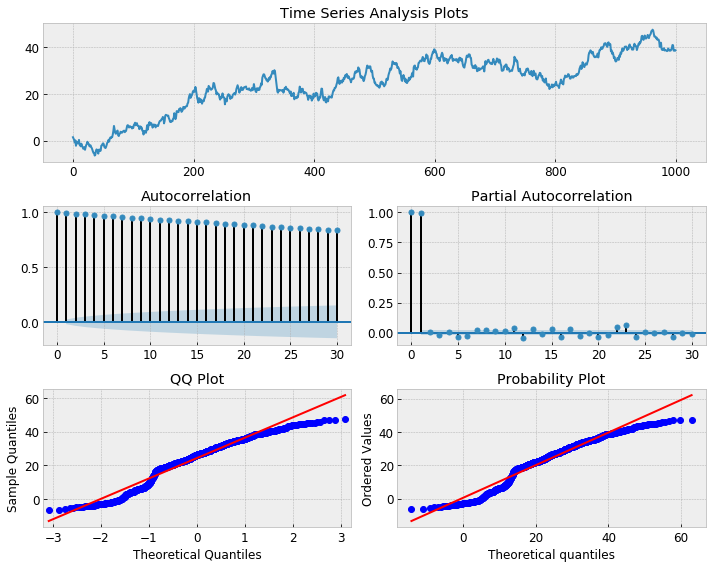

In [52]:
# Random Walk without a drift

np.random.seed(1)
n_samples = 1000

x = w = np.random.normal(size=n_samples)
for t in range(n_samples):
    x[t] = x[t-1] + w[t]

_ = tsplot(x, lags=30)

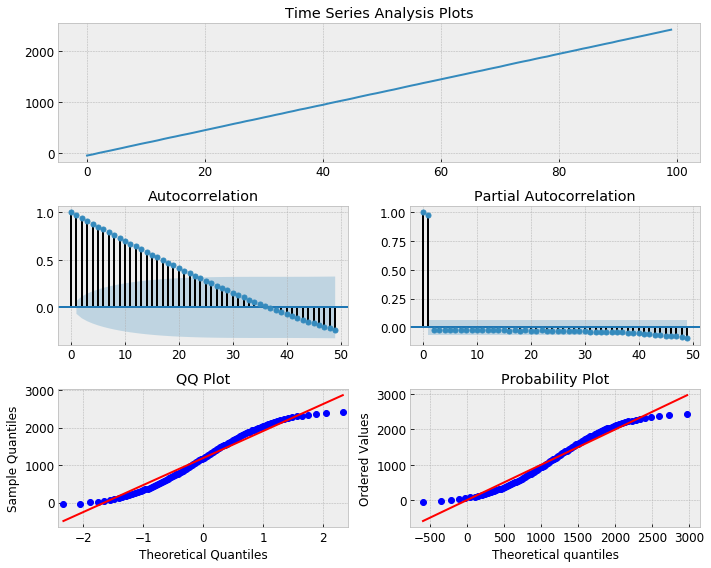

In [53]:
# simulate linear trend
# example Firm ABC sales are -$50 by default and +$25 at every time step

w = np.random.randn(100)
y = np.empty_like(w)

b0 = -50.
b1 = 25.
for t in range(len(w)):
    y[t] = b0 + b1*t + w[t]
    
_ = tsplot(y, lags=lags)  

In [54]:
altcoins = ['ETH','LTC','XRP','ETC','STR','DASH','SC','XMR','XEM', 'ZEC']

altcoin_data = {}
for altcoin in altcoins:
    coinpair = 'BTC_{}'.format(altcoin)
    crypto_price_df = get_crypto_data(coinpair)
    altcoin_data[altcoin] = crypto_price_df
    
for altcoin in altcoin_data.keys():
    altcoin_data[altcoin]['price_usd'] =  altcoin_data[altcoin]['weightedAverage'] * btc_usd_datasets['avg_btc_price_usd']
    
combined_df = merge_dfs_on_column(list(altcoin_data.values()), list(altcoin_data.keys()), 'price_usd')

combined_df['BTC'] = btc_usd_datasets['avg_btc_price_usd']

Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache
Loaded https://bitcoinchain.com/markets/btcusd-okcoin from cache


In [55]:
y = combined_df['BTC'].resample('MS').mean()

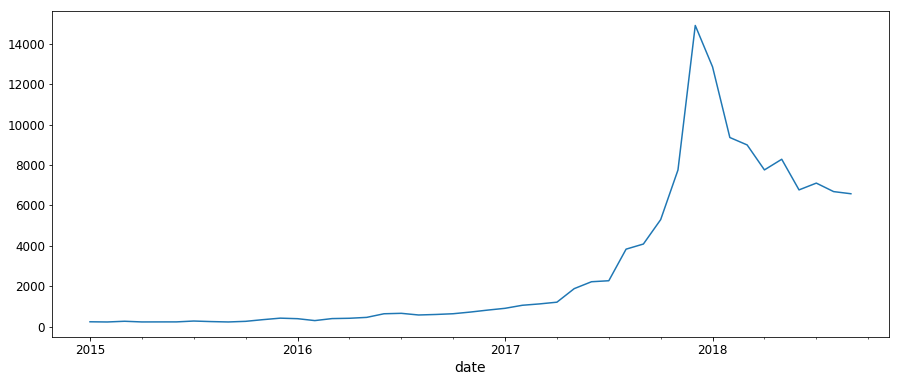

In [56]:
y.plot(figsize=(15, 6))
plt.show()

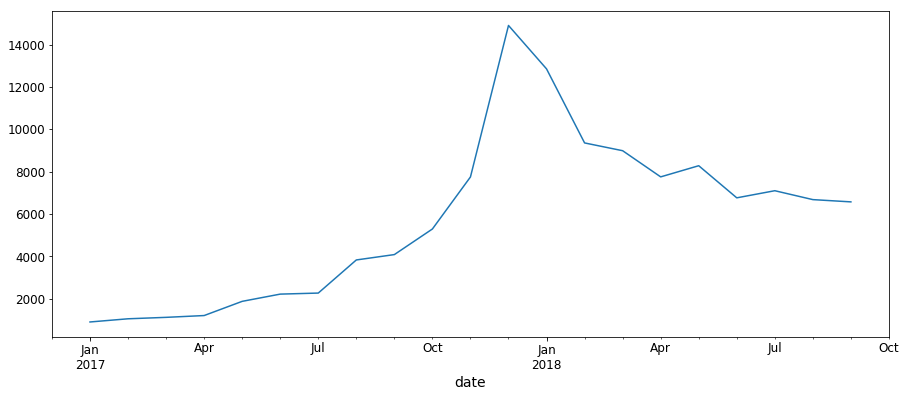

In [57]:
y['2017':].plot(figsize=(15, 6))
plt.show()

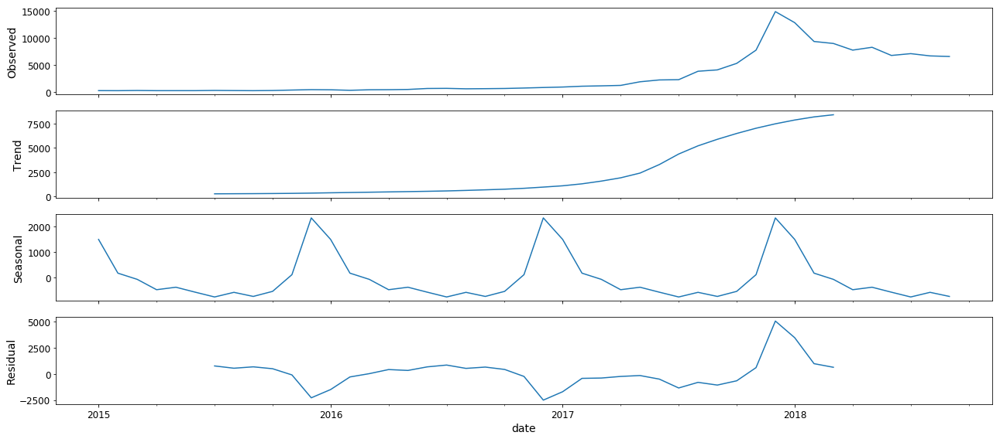

In [58]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()
plt.show()

In [59]:
'''Time series forecasting with ARIMA (Autoregressive Integrated Moving Average)'''

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [60]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:872.707688569202
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:1263.709649947687
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:634.4635615308989
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:640.408392241142
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1212.251256935578
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:421.29675815344257
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:806.3421343776954
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2639.0374967200673
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:595.4471344487545
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:612.1943275462337
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2330.994497818024
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:403.17485253830654
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:746.2620407775171
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1086.1752874664721
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:550.4075167755319
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:567.2503966520505
ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:1171.5998542326477
ARIMA(0, 1, 0)x(1, 1, 0, 12)12 - AIC:364.8870247746252
ARIMA(0

In [61]:
'''The above output suggests that SARIMAX(1, 1, 1)x(1, 1, 0, 12) yields the lowest AIC value of:349.32'''

'''Therefore we should consider this to be optimal option.'''

#Fitting the ARIMA model

mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7004      0.162     -4.323      0.000      -1.018      -0.383
ma.L1          1.1363      0.087     13.047      0.000       0.966       1.307
ar.S.L12      -1.4478      5.293     -0.274      0.784     -11.821       8.926
sigma2      2.992e+06   2.68e-06   1.12e+12      0.000    2.99e+06    2.99e+06


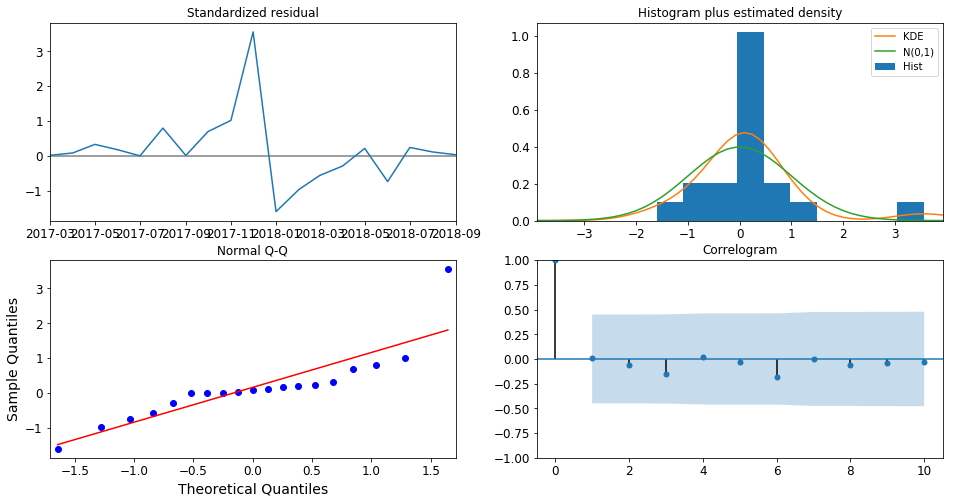

In [62]:
'''Fitting the ARIMA Model'''

'''Running model diagnostics to investigate any unusual behavior.'''

results.plot_diagnostics(figsize=(16, 8))
plt.show()

#Nearly normally distributed

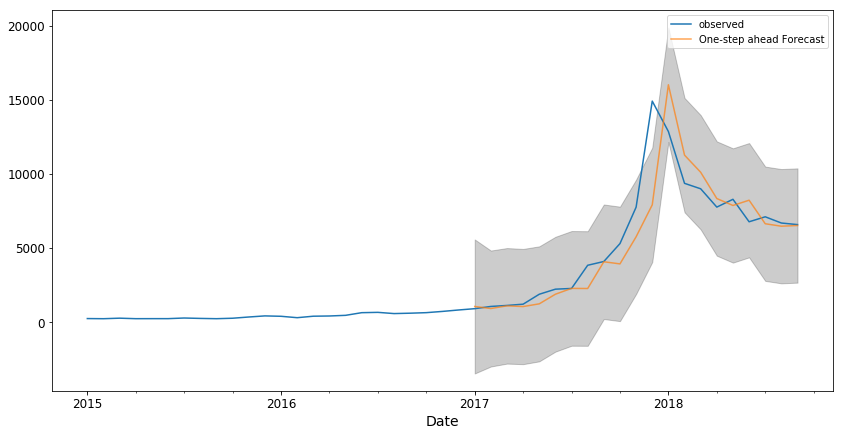

'The line plot is showing the observed values compared to the rolling forecast predictions.\n   Overall, our forecasts align with the true values very well.'

In [63]:
'''Validating forecasts'''

pred = results.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2014':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
plt.legend()
plt.show()

'''The line plot is showing the observed values compared to the rolling forecast predictions.
   Overall, our forecasts align with the true values very well.'''

In [64]:
''' Mean Squared Error of our forecasts'''

y_forecasted = pred.predicted_mean
y_truth = y['2017-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

'''The MSE is a measure of the quality of an estimator — it is always non-negative,
and the smaller the MSE, the closer we are to finding the line of best fit.'''

The Mean Squared Error of our forecasts is 3596819.56


'The MSE is a measure of the quality of an estimator\u200a—\u200ait is always non-negative,\nand the smaller the MSE, the closer we are to finding the line of best fit.'

In [65]:
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

'''Root Mean Square Error (RMSE) tells us that our model was able to forecast the average daily.'''

The Root Mean Squared Error of our forecasts is 1896.53


'Root Mean Square Error (RMSE) tells us that our model was able to forecast the average daily.'

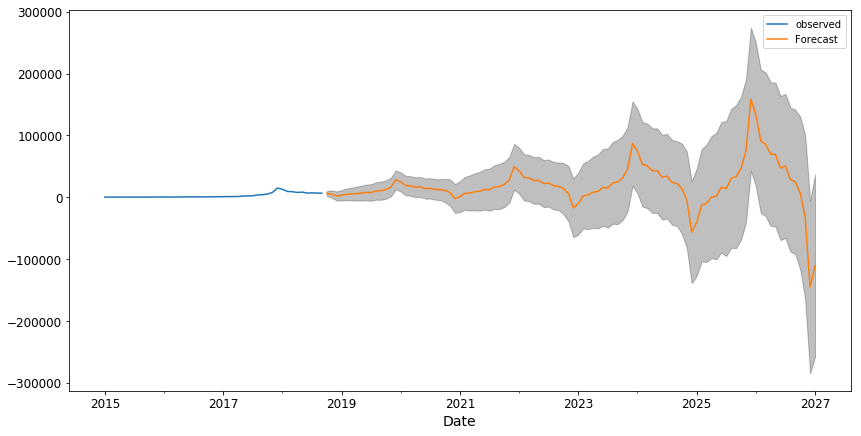

In [66]:
'''Producing and visualizing forecasts'''

pred_uc = results.get_forecast(steps=100)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')

plt.legend()
plt.show()

Text(0,0.5,'value')

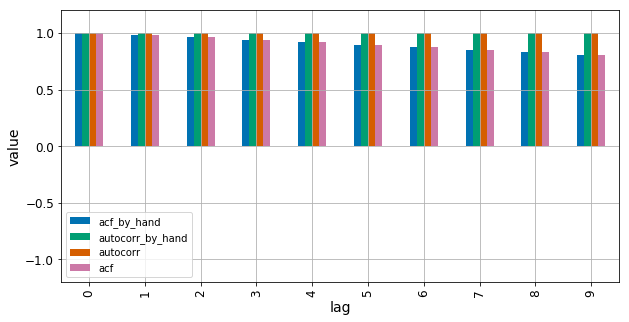

In [67]:
'''Some difference in pandas autocorr and statsmodel autocorr'''

plt.style.use("seaborn-colorblind")

def autocorr_by_hand(x, lag):
    # Slice the relevant subseries based on the lag
    y1 = x[:(len(x)-lag)]
    y2 = x[lag:]
    # Subtract the subseries means
    sum_product = np.sum((y1-np.mean(y1))*(y2-np.mean(y2)))
    # Normalize with the subseries stds
    return sum_product / ((len(x) - lag) * np.std(y1) * np.std(y2))

def acf_by_hand(x, lag):
    # Slice the relevant subseries based on the lag
    y1 = x[:(len(x)-lag)]
    y2 = x[lag:]
    # Subtract the mean of the whole series x to calculate Cov
    sum_product = np.sum((y1-np.mean(x))*(y2-np.mean(x)))
    # Normalize with var of whole series
    return sum_product / ((len(x) - lag) * np.var(x))

x = np.linspace(0,100,101)

results = {}
nlags=10
results["acf_by_hand"] = [acf_by_hand(x, lag) for lag in range(nlags)]
results["autocorr_by_hand"] = [autocorr_by_hand(x, lag) for lag in range(nlags)]
results["autocorr"] = [pd.Series(x).autocorr(lag) for lag in range(nlags)]
results["acf"] = acf(x, unbiased=True, nlags=nlags-1)

pd.DataFrame(results).plot(kind="bar", figsize=(10,5), grid=True)
plt.xlabel("lag")
plt.ylim([-1.2, 1.2])
plt.ylabel("value")

In [68]:
'''Last half year has indeed been very volatile and active period as we saw inflows of “new money” into the markets.
In order to do truly meaningful analysis, however, we need to work with percentage returns,
which we can easily achieve by running:'''

crypto_df_pct = combined_df.pct_change().dropna()

In [69]:
corr = crypto_df_pct.corr()

In [70]:
corr['LTC']['BTC']

0.6331219362252024

' the cryptocurrencies tend to mainly move together, at least against the dollar, as confirmed by all correlation values\nbeing over 0'

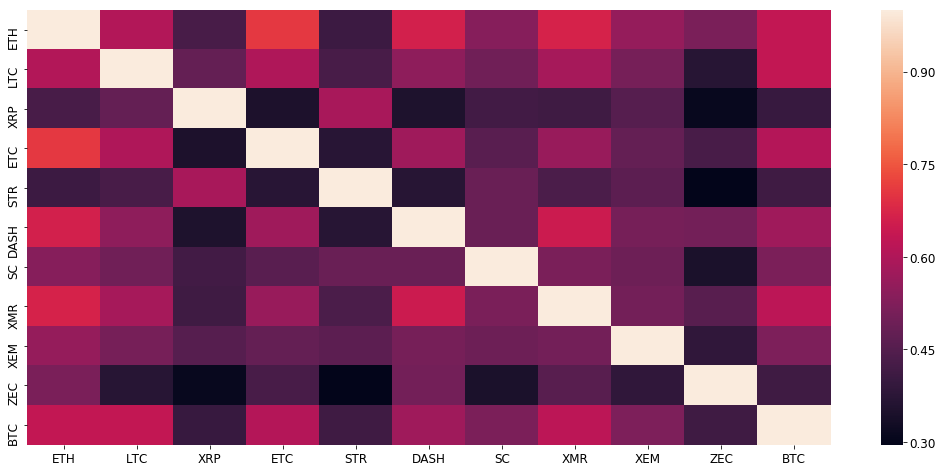

In [71]:
import seaborn as sns
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

''' the cryptocurrencies tend to mainly move together, at least against the dollar, as confirmed by all correlation values
being over 0'''

In [72]:
'''we may wish to analyse a relationship between two highly correlated currencies'''

corr['XMR']['DASH']

0.6478936243832524

'The relationship looks linear for most data points, but seems to be chaotic for extremely positive returns, \nexhibiting a “fan-like” relationship'

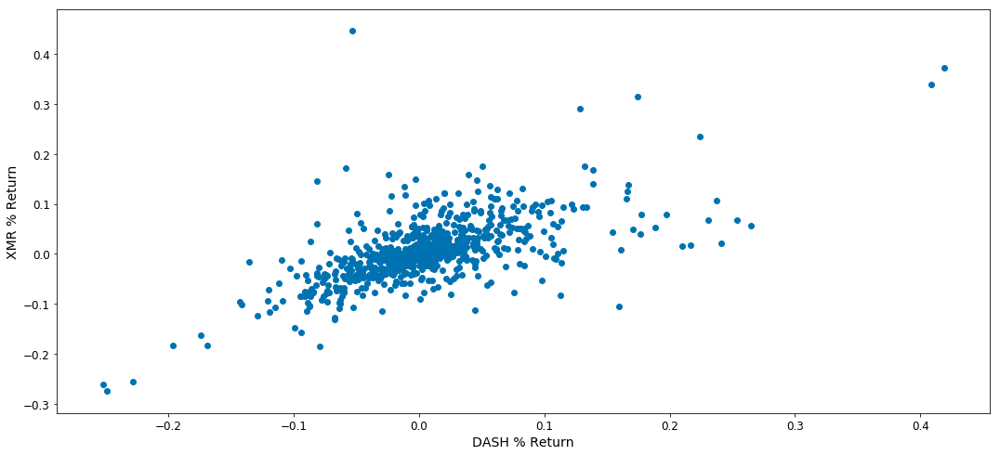

In [73]:
'''A scatter plot of respective returns'''

plt.scatter(crypto_df_pct['DASH'],crypto_df_pct['XMR'])
plt.xlabel('DASH % Return')
plt.ylabel('XMR % Return')

'''The relationship looks linear for most data points, but seems to be chaotic for extremely positive returns, 
exhibiting a “fan-like” relationship'''

In [74]:
import statsmodels.api as sm
model = sm.OLS(crypto_df_pct['XMR'],
               crypto_df_pct['DASH']).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    XMR   R-squared:                       0.424
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     509.5
Date:                Tue, 20 Nov 2018   Prob (F-statistic):           5.79e-85
Time:                        14:03:15   Log-Likelihood:                 1086.7
No. Observations:                 693   AIC:                            -2171.
Df Residuals:                     692   BIC:                            -2167.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
DASH           0.6481      0.029     22.572      0.000       0.592       0.704
==============================================================================
Omnibus:                      306.332   Durbin-Watson:                   1.813
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5299.648
Skew:                           1.525   Prob(JB):                         0.00
Kurtosis:                      16.200   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0,0.5,'XMR % Return')

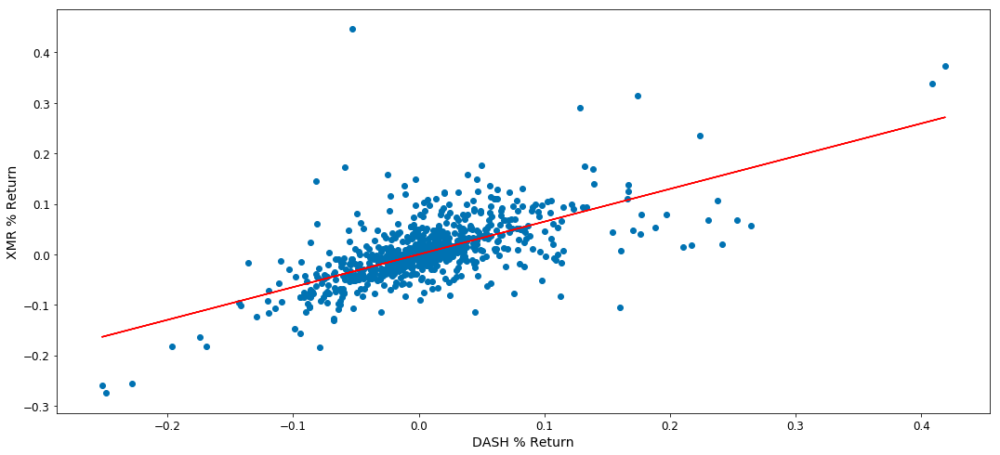

In [75]:
'''positive correlation between XMR AND DASH'''

line=[model.params[0]*i for i in crypto_df_pct['DASH'].values]
plt.plot(crypto_df_pct['DASH'], line, c = 'r')
plt.scatter(crypto_df_pct['DASH'],crypto_df_pct['XMR'])
plt.xlabel('DASH % Return')
plt.ylabel('XMR % Return')

In [76]:
'''we may wish to analyse a relationship between two highly correlated currencies'''

corr['XMR']['ETH']

0.6677522071284515

'The relationship looks linear for most data points, but seems to be chaotic for extremely positive returns, \nexhibiting a “fan-like” relationship'

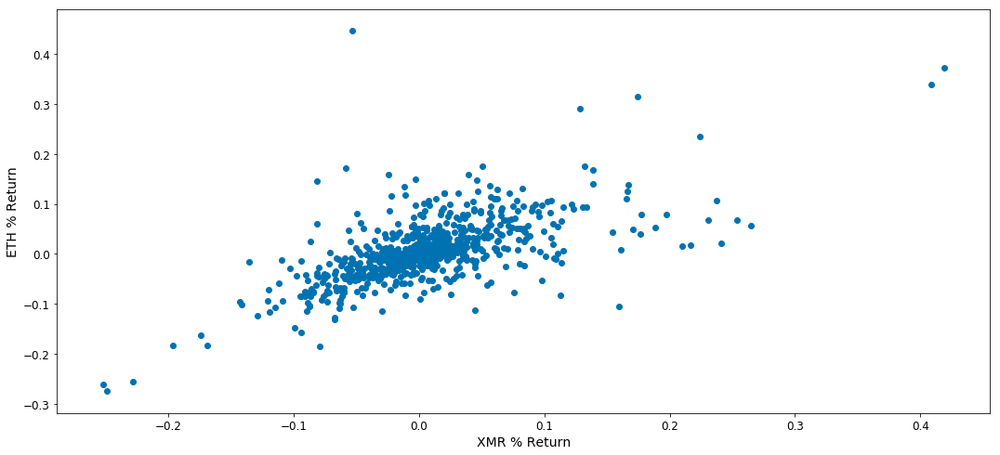

In [77]:
'''A scatter plot of respective returns'''

plt.scatter(crypto_df_pct['DASH'],crypto_df_pct['XMR'])
plt.xlabel('XMR % Return')
plt.ylabel('ETH % Return')

'''The relationship looks linear for most data points, but seems to be chaotic for extremely positive returns, 
exhibiting a “fan-like” relationship'''

In [78]:
import statsmodels.api as sm
model = sm.OLS(crypto_df_pct['ETH'],
               crypto_df_pct['XMR']).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    ETH   R-squared:                       0.450
Model:                            OLS   Adj. R-squared:                  0.449
Method:                 Least Squares   F-statistic:                     566.3
Date:                Tue, 20 Nov 2018   Prob (F-statistic):           6.46e-92
Time:                        14:03:16   Log-Likelihood:                 1131.8
No. Observations:                 693   AIC:                            -2262.
Df Residuals:                     692   BIC:                            -2257.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
XMR            0.6433      0.027     23.796      0.000       0.590       0.696
==============================================================================
Omnibus:                       97.110   Durbin-Watson:                   1.636
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              408.864
Skew:                           0.570   Prob(JB):                     1.65e-89
Kurtosis:                       6.586   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0,0.5,'ETH % Return')

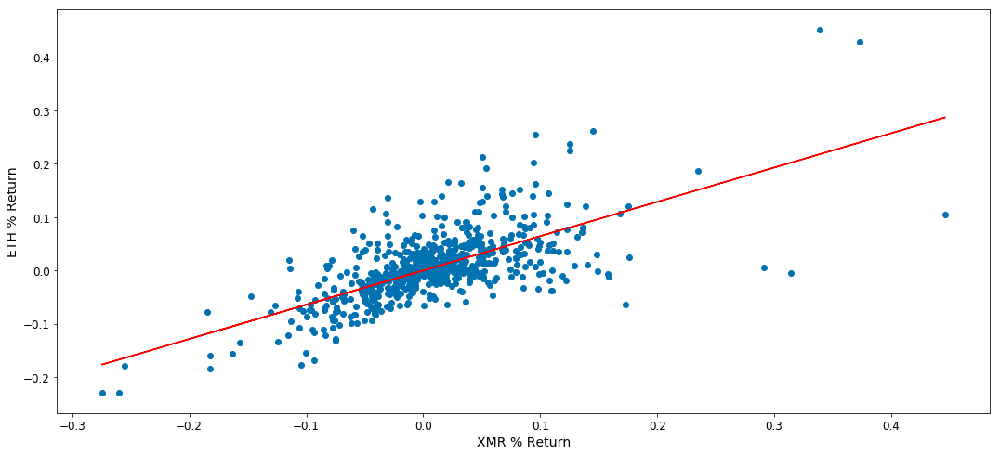

In [79]:
'''positive correlation between XMR AND ETH'''

line=[model.params[0]*i for i in crypto_df_pct['XMR'].values]
plt.plot(crypto_df_pct['XMR'], line, c = 'r')
plt.scatter(crypto_df_pct['XMR'],crypto_df_pct['ETH'])
plt.xlabel('XMR % Return')
plt.ylabel('ETH % Return')

In [80]:
from __future__ import division
from itertools import count
import matplotlib.pyplot as plt
from numpy import linspace, loadtxt, ones, convolve

import collections
from random import randint
from matplotlib import style
style.use('fivethirtyeight')
%matplotlib inline

In [81]:
# 1. Download sunspot dataset and upload the same to dataset directory
#    Load the sunspot dataset as an Array
!mkdir -p dataset

# 2. View the data as a table
df = pd.read_csv('C:\\Users\\ShiviMalhotra\\Desktop\\research material\\crypto-markets.csv') 
data_as_frame = pd.DataFrame(df, columns=['spread', 'volume'])
data_as_frame.tail()
#df.tail()

A subdirectory or file -p already exists.
Error occurred while processing: -p.
A subdirectory or file dataset already exists.
Error occurred while processing: dataset.


,spread,volume
1861,198.57,4.939300e+09
1862,141.85,4.851760e+09
1863,279.78,4.993170e+09
1864,246.23,4.961740e+09
1865,178.42,4.692260e+09


In [82]:
# 3. Lets define some use-case specific UDF(User Defined Functions)

def moving_average(combined_df, window_size):
 
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(combined_df, window, 'same')


def explain_anomalies(y, window_size, sigma=1.0):
    avg = moving_average(y, window_size).tolist()
    residual = y - avg
    # Calculate the variation in the distribution of the residual
    std = np.std(residual)
    return {'standard_deviation': round(std, 3),
            'anomalies_dict': collections.OrderedDict([(index, y_i) for
                                                       index, y_i, avg_i in zip(count(), y, avg)
              if (y_i > avg_i + (sigma*std)) | (y_i < avg_i - (sigma*std))])}


def explain_anomalies_rolling_std(y, window_size, sigma=1.0):
    avg = moving_average(y, window_size)
    avg_list = avg.tolist()
    residual = y - avg
    # Calculate the variation in the distribution of the residual
    testing_std = pd.rolling_std(residual, window_size)
    testing_std_as_df = pd.DataFrame(testing_std)
    rolling_std = testing_std_as_df.replace(np.nan,
                                  testing_std_as_df.ix[window_size - 1]).round(3).iloc[:,0].tolist()
    std = np.std(residual)
    return {'stationary standard_deviation': round(std, 3),
            'anomalies_dict': collections.OrderedDict([(index, y_i)
                                                       for index, y_i, avg_i, rs_i in zip(count(),
                                                                                           y, avg_list, rolling_std)
              if (y_i > avg_i + (sigma * rs_i)) | (y_i < avg_i - (sigma * rs_i))])}


# This function is repsonsible for displaying how the function performs on the given dataset.
def plot_results(x, y, window_size, sigma_value=1,
                 text_xlabel="X Axis", text_ylabel="Y Axis", applying_rolling_std=False):
  
    plt.figure(figsize=(15, 8))
    plt.plot(x, y, "k.")
    y_av = moving_average(y, window_size)
    plt.plot(x, y_av, color='green')
    plt.xlim(0, 1000)
    plt.xlabel(text_xlabel)
    plt.ylabel(text_ylabel)

    # Query for the anomalies and plot the same
    events = {}
    if applying_rolling_std:
        events = explain_anomalies_rolling_std(y, window_size=window_size, sigma=sigma_value)
    else:
        events = explain_anomalies(y, window_size=window_size, sigma=sigma_value)

    x_anomaly = np.fromiter(events['anomalies_dict'].keys(), dtype=int, count=len(events['anomalies_dict']))
    y_anomaly = np.fromiter(events['anomalies_dict'].values(), dtype=float,
                                            count=len(events['anomalies_dict']))
    plt.plot(x_anomaly, y_anomaly, "r*", markersize=12)

    # add grid and lines and enable the plot
    plt.grid(True)
    plt.show()

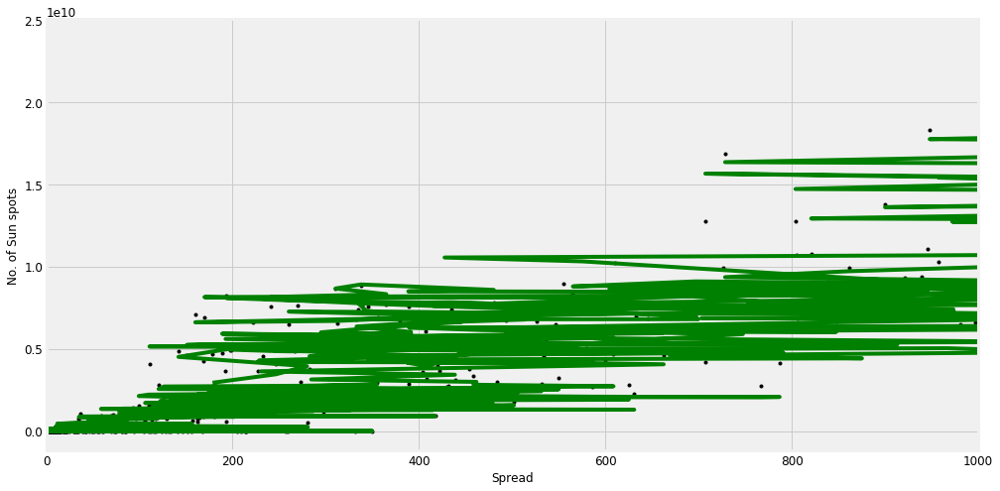

Information about the anomalies model:{'standard_deviation': 994.058, 'anomalies_dict': OrderedDict([(35, 14904.144062437028)])}


In [83]:
# 4. Lets play with the functions
x = data_as_frame['spread']
Y = data_as_frame['volume']

# plot the results
plot_results(x, y=Y, window_size=10, text_xlabel="Spread", sigma_value=3,
             text_ylabel="No. of Sun spots")
events = explain_anomalies(y, window_size=5, sigma=3)

# Display the anomaly dict
print("Information about the anomalies model:{}".format(events))

In [84]:
import numpy as np
from sklearn.cluster import KMeans

### For the purposes of this example, we store feature data from our
### dataframe `df`, in the `f1` and `f2` arrays. We combine this into
### a feature matrix `X` before entering it into the algorithm.
f1 = df['close_ratio'].values
f2 = df['volume'].values

X=np.matrix(list(zip(f1,f2)))
kmeans = KMeans(n_clusters=2).fit(X)

In [85]:
import numpy as np
from scipy import stats

def randint64(low, high, size, seed=None):

    # generate a string of random bytes
    n = np.prod(size)
    bytes = np.random.RandomState(seed).bytes(n * 8)

    # view as an int64 array
    ints = np.fromstring(bytes, np.int64, n).reshape(size)

    ints %= np.int64(high - low)    # truncate
    ints += np.int64(low)           # offset

    return ints

imax = np.iinfo(np.int64).max
print(imax)

ints = randint64(0, imax, int(1E6), seed=0)

print(ints.max())

# test uniformity
print(stats.kstest(ints, stats.uniform(loc=0, scale=imax).cdf))

9223372036854775807
9223366396942831276
KstestResult(statistic=0.0008596180755627847, pvalue=0.4508259825683668)


Text(0.5,1,'Raw data')

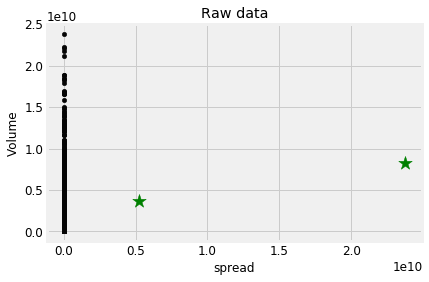

In [86]:
k=2

C_x = randint64(0, np.max(X)-20, size=k)
C_y = randint64(0, np.max(X)-20, size=k)

C=np.array(list(zip(C_x,C_y)), dtype=np.float32)

plt.scatter(f1, f2, c= "#050505", s=20)
plt.scatter(C_x, C_y, marker='*', s=200, c= 'g')
plt.xlabel('spread')
plt.ylabel('Volume')
plt.title('Raw data')
 

In [87]:
from numpy import genfromtxt
from scipy.stats import multivariate_normal
from sklearn.metrics import f1_score

In [88]:
def read_dataset(filePath,delimiter=','):
    return genfromtxt(filePath, delimiter=delimiter)

def feature_normalize(dataset):
    mu = np.mean(dataset,axis=0)
    sigma = np.std(dataset,axis=0)
    return (dataset - mu)/sigma

def estimateGaussian(dataset):
    mu = np.mean(dataset, axis=0)
    sigma = np.cov(dataset.T)
    return mu, sigma
    
def multivariateGaussian(dataset,mu,sigma):
    p = multivariate_normal(mean=mu, cov=sigma)
    return p.pdf(dataset)

In [89]:
def selectThresholdByCV(probs,gt):
    best_epsilon = 0
    best_f1 = 0
    f = 0
    stepsize = (max(probs) - min(probs)) / 1000;
    epsilons = np.arange(min(probs),max(probs),stepsize)
    for epsilon in np.nditer(epsilons):
        predictions = (probs < epsilon)
        f = f1_score(gt, predictions, average = "binary")
        if f > best_f1:
            best_f1 = f
            best_epsilon = epsilon
    return best_f1, best_epsilon

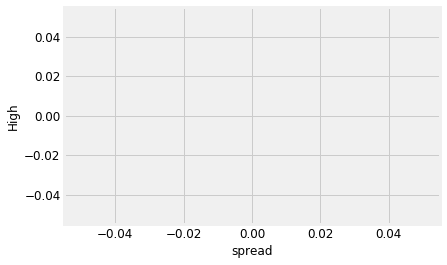

In [90]:
tr_data = read_dataset('C:\\Users\\ShiviMalhotra\\Desktop\\research material\\bitcoins.csv') 
cv_data = read_dataset('crypto-markets.csv') 
#gt_data = read_dataset('gt_server_data.csv')

n_training_samples = tr_data.shape[0]
n_dim = tr_data.shape[1]

plt.figure()
plt.xlabel("spread")
plt.ylabel("High")
plt.plot(tr_data[:,0],tr_data[:,1],"bx")
plt.show()

In [91]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager
from sklearn import svm


In [92]:
# Generate train data
X = 0.3 * np.random.randn(100, 2)
X_train = np.r_[X + 2, X - 2]
# Generate some regular novel observations
X = 0.3 * np.random.randn(20, 2)
X_test = np.r_[X + 2, X - 2]
# Generate some abnormal novel observations
X_outliers = np.random.uniform(low=-4, high=4, size=(20, 2))

In [93]:
# fit the model
clf = svm.OneClassSVM(nu=0.1, kernel="rbf", gamma=0.1)
clf.fit(X_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
y_pred_outliers = clf.predict(X_outliers)
n_error_train = y_pred_train[y_pred_train == -1].size
n_error_test = y_pred_test[y_pred_test == -1].size
n_error_outliers = y_pred_outliers[y_pred_outliers == 1].size

In [94]:
# plot the line, the points, and the nearest vectors to the plane
xx, yy = np.meshgrid(np.linspace(-5, 5, 500), np.linspace(-5, 5, 500))
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

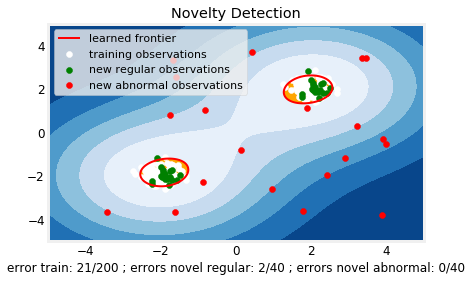

In [95]:
plt.title("Novelty Detection")
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.Blues_r)
a = plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='red')
plt.contourf(xx, yy, Z, levels=[0, Z.max()], colors='orange')
 
b1 = plt.scatter(X_train[:, 0], X_train[:, 1], c='white')
b2 = plt.scatter(X_test[:, 0], X_test[:, 1], c='green')
c = plt.scatter(X_outliers[:, 0], X_outliers[:, 1], c='red')
plt.axis('tight')
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.legend([a.collections[0], b1, b2, c],
           ["learned frontier", "training observations",
            "new regular observations", "new abnormal observations"],
           loc="upper left",
           prop=matplotlib.font_manager.FontProperties(size=11))
plt.xlabel(
    "error train: %d/200 ; errors novel regular: %d/40 ; "
    "errors novel abnormal: %d/40"
    % (n_error_train, n_error_test, n_error_outliers))
plt.show()

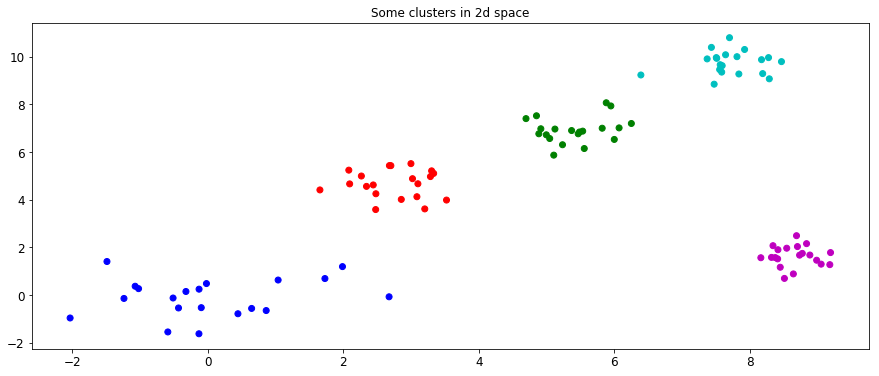

In [101]:
from itertools import cycle

n = 20

size = (n, 2)

x = np.random.normal(0, 1, size)
np.random.seed(3)

for i in range(4):
    center = (np.random.rand(2) * 10)
    x = np.append(x, np.random.normal(center, .5, size), axis=0)
    c = [c for s in [v * n for v in 'bgrcmyk'] for c in list(s)]

plt.figure(figsize=(15, 6))
plt.title('Some clusters in 2d space')
plt.scatter(x[:, 0], x[:, 1], c=c)
plt.show()

In [121]:
import plotly.plotly as py
import plotly.graph_objs as go

from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs

In [122]:
centers = [[1, 1], [-1, -1], [1, -1]]
X, labels_true = make_blobs(n_samples=300, centers=centers, cluster_std=0.5,
                            random_state=0)



In [123]:
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(labels_true, labels))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))

Estimated number of clusters: 3
Homogeneity: 0.872
Completeness: 0.872
V-measure: 0.872
Adjusted Rand Index: 0.912
Adjusted Mutual Information: 0.871
Silhouette Coefficient: 0.753


In [124]:
import plotly as py
import csv

import plotly.graph_objs as go
from plotly.offline import *

py.offline.init_notebook_mode()
colors = ['blue','green','red','cyan','magenta']
data = pd.read_csv("BTC.csv")


'''with open('crypto-markets.csv', 'r') as f:
    reader = csv.reader(f)
    data = list(reader)'''
    

#print (data)
#data.apply(train.mean(), inplace=True)

"with open('crypto-markets.csv', 'r') as f:\n    reader = csv.reader(f)\n    data = list(reader)"

In [125]:
data.dropna()

,name,open,high,low,close
0,Bitcoin,0.213899,0.378883,0.213899,0.374024
1,Bitcoin,0.331111,0.354461,0.219434,0.314865
2,Bitcoin,0.325840,0.459833,0.310345,0.406976
3,Bitcoin,0.406039,1.500000,0.402588,1.450000
4,Bitcoin,1.180000,1.500000,0.841751,1.040000
5,Bitcoin,1.040000,1.210000,0.851995,0.941647
6,Bitcoin,0.941944,1.230000,0.894865,1.060000
7,Bitcoin,1.050000,1.330000,1.020000,1.130000
8,Bitcoin,1.120000,1.260000,0.696502,1.240000
9,Bitcoin,1.150000,3.360000,0.623443,1.150000


In [126]:

for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    trace1 = go.Scatter(x=X[class_members, 0], 
                        y=X[class_members, 1],
                        showlegend=False,
                        mode='markers', marker=dict(color=col, size=10))
    
    trace2 = go.Scatter(x=[cluster_center[0]], 
                        y=[cluster_center[1]], 
                        showlegend=False,
                        mode='markers', marker=dict(color=col, size=14))
     
        
    data = [trace1]
    data = [trace1, trace2]
    for x in X[class_members]:
        trace3 = go.Scatter(x = [cluster_center[0], x[0]], 
                            y=[cluster_center[1], x[1]],
                            showlegend=False,
                            mode='lines', line=dict(color=col,
                                                    width=2))
    
    
    
        data = [trace1, trace2, trace3]
        
layout = go.Layout(title='Estimated number of clusters: %d' % n_clusters_,
                   xaxis=dict(zeroline=False),
                   yaxis=dict(zeroline=False))
fig = go.Figure(data=data, layout=layout)

py.offline.plot(fig, filename='gauge-meter-chart.html')



'file://C:\\Users\\ShiviMalhotra\\crypto-data\\gauge-meter-chart.html'

In [132]:
from sklearn.cluster import KMeans
csv1=pd.read_csv("Bitcoins.csv")
csv2=pd.read_csv("ETH.csv")
csv1.drop("name",axis=1,inplace=True)
csv2.drop("name",axis=1,inplace=True)
#Km=KMeans(n_clusters=1, init=’k-means++’, n_init=10, max_iter=300, tol=0.0001, precompute_distances=’auto’, verbose=0, random_state=None, copy_x=True, n_jobs=1, algorithm=’auto’)
csv1=np.array(csv1)
csv2=np.array(csv2)
#print(csv1.shape[0])
c1=(np.sum(csv1,axis=0)/csv1.shape[0])#.reshape(11,1)
c2=(np.sum(csv2,axis=0)/csv2.shape[0])#.reshape(11,1)
#print(np.sum(np.power(c1-csv1,2),axis=1).shape)
#print(c2)
dis1=np.sum(np.power(np.sum(np.power(c1-csv1,2),axis=1),1/2))/csv1.shape[0]
dis2=np.sum(np.power(np.sum(np.power(c2-csv2,2),axis=1),1/2))/csv2.shape[0]
#print(2*dis1)
#print(2*dis2)
count=0
s=list()
ss=list()
cu=0
for i in csv1:
    #print(i)
    if(np.power(np.sum(np.power(c1-i,2)),1/2)<=3.5*dis1):
        cu=cu+1
        continue
    else:
        s.append(cu)
        cu=cu+1
count=0
cu1=0
for i in csv2:
    #print(i)
    if(np.power(np.sum(np.power(c2-i,2)),1/2)<=3.5*dis2):
        cu1=cu1+1
        continue
    else:
        ss.append(cu1)
        cu1=cu1+1

print("BTC anomalies: ")        
print(s)

print("\nETH anomalies: ")        
print(ss)



BTC anomalies: 
[1675, 1676, 1677, 1678, 1679, 1680, 1681, 1682, 1683, 1684, 1685, 1686, 1687, 1688, 1689, 1690, 1691, 1692, 1693, 1694, 1695, 1696, 1697, 1698, 1699, 1700, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1708, 1709, 1710, 1711, 1712, 1713, 1714, 1715, 1716, 1717, 1718, 1719, 1720, 1721, 1722, 1723, 1724, 1725, 1726, 1727, 1728, 1729, 1730, 1731, 1732, 1733, 1734, 1735, 1736, 1737, 1738, 1739, 1754, 1755, 1756, 1757, 1758, 1759, 1760, 1761, 1762, 1763, 1764, 1765, 1766, 1767, 1768, 1769, 1770, 1771, 1772, 1773, 1774, 1775, 1832, 1833, 1834]

ETH anomalies: 
[883, 884, 885, 886, 887, 888, 889, 890, 891, 892, 893, 895, 896, 897, 898, 899, 901, 902, 903, 904, 905, 906, 907, 908, 909]


In [133]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [134]:
train = pd.read_csv("crypto-markets.csv")

test = pd.read_csv("Bitcoins.csv")

In [135]:
print("***** Train_Set *****")
print(train.head())
print("\n")
print("***** Test_Set *****")
print(test.head())

***** Train_Set *****
      slug symbol     name        date  ranknow    open    high     low  \
0  bitcoin    BTC  Bitcoin  2013-04-28        1  135.30  135.98  132.10   
1  bitcoin    BTC  Bitcoin  2013-04-29        1  134.44  147.49  134.00   
2  bitcoin    BTC  Bitcoin  2013-04-30        1  144.00  146.93  134.05   
3  bitcoin    BTC  Bitcoin  2013-05-01        1  139.00  139.89  107.72   
4  bitcoin    BTC  Bitcoin  2013-05-02        1  116.38  125.60   92.28   

    close  volume        market  close_ratio  spread  
0  134.21     0.0  1.500520e+09       0.5438    3.88  
1  144.54     0.0  1.491160e+09       0.7813   13.49  
2  139.00     0.0  1.597780e+09       0.3843   12.88  
3  116.99     0.0  1.542820e+09       0.2882   32.17  
4  105.21     0.0  1.292190e+09       0.3881   33.32  


***** Test_Set *****
      name    open    high     low   close
0  Bitcoin  135.30  135.98  132.10  134.21
1  Bitcoin  134.44  147.49  134.00  144.54
2  Bitcoin  144.00  146.93  134.05  139.00
3 

In [136]:
'''to handle the missing values present in the data'''

# For the train set
train.isna().head()

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
0,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False


In [137]:
# For the test set
test.isna().head()

,name,open,high,low,close
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False


In [138]:
'''Total no. of missing values'''

print("*****In the train set*****")
print(train.isna().sum())
print("\n")
print("*****In the test set*****")
print(test.isna().sum())

*****In the train set*****
slug           0
symbol         0
name           0
date           0
ranknow        0
open           0
high           0
low            0
close          0
volume         0
market         0
close_ratio    1
spread         1
dtype: int64


*****In the test set*****
name     0
open     0
high     0
low      0
close    0
dtype: int64


In [139]:
"""Mean Imputation"""

# Fill missing values with mean column values in the train set
train.fillna(train.mean(), inplace=True)

In [140]:
# Fill missing values with mean column values in the test set
test.fillna(test.mean(), inplace=True)

In [141]:
'''to see if the dataset still has any missing values.'''

print(train.isna().sum())

slug           0
symbol         0
name           0
date           0
ranknow        0
open           0
high           0
low            0
close          0
volume         0
market         0
close_ratio    0
spread         0
dtype: int64


In [142]:
'''to see if the dataset still has any missing values.'''
print(test.isna().sum())

name     0
open     0
high     0
low      0
close    0
dtype: int64


In [143]:
"""Some features can be dropped"""

train = train.drop(['name','slug', 'date','symbol'], axis=1)
test = test.drop(['name',], axis=1)

In [144]:
  train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11570 entries, 0 to 11569
Data columns (total 9 columns):
ranknow        11570 non-null int64
open           11570 non-null float64
high           11570 non-null float64
low            11570 non-null float64
close          11570 non-null float64
volume         11570 non-null float64
market         11570 non-null float64
close_ratio    11570 non-null float64
spread         11570 non-null float64
dtypes: float64(8), int64(1)
memory usage: 813.6 KB


In [145]:
"""K-model building"""
X = np.array(train.drop(['ranknow'], 1).astype(float))
y = np.array(train['ranknow'])
kmeans = KMeans(n_clusters=2) 
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [146]:
correct = 0
for i in range(len(X)):
    predict_me = np.array(X[i].astype(float))
    predict_me = predict_me.reshape(-1, len(predict_me))
    prediction = kmeans.predict(predict_me)
    if prediction[0] == y[i]:
        correct += 1

print(correct/len(X))

'''accuracy of your model'''

0.022904062229904928


'accuracy of your model'

In [147]:
'''scikit-learn implementation of K-Means'''

kmeans = kmeans = KMeans(n_clusters=2, max_iter=600, algorithm = 'auto')
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=600,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [148]:
correct = 0
for i in range(len(X)):
    predict_me = np.array(X[i].astype(float))
    predict_me = predict_me.reshape(-1, len(predict_me))
    prediction = kmeans.predict(predict_me)
    if prediction[0] == y[i]:
        correct += 1

print(correct/len(X))

0.022904062229904928


In [149]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [150]:
kmeans.fit(X_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=600,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [151]:
correct = 0
for i in range(len(X)):
    predict_me = np.array(X[i].astype(float))
    predict_me = predict_me.reshape(-1, len(predict_me))
    prediction = kmeans.predict(predict_me)
    if prediction[0] == y[i]:
        correct += 1

print(correct/len(X))

0.1612791702679343


In [152]:
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('ggplot')

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 13

from numpy import genfromtxt
from scipy.stats import multivariate_normal
from sklearn.metrics import f1_score


from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [153]:
def read_dataset(filePath,delimiter=','):
    return genfromtxt(filePath, delimiter=delimiter)

def feature_normalize(dataset):
    mu = np.mean(dataset,axis=0)
    sigma = np.std(dataset,axis=0)
    return (dataset - mu)/sigma

def estimateGaussian(dataset):
    mu = np.mean(dataset, axis=0)
    sigma = np.cov(dataset.T)
    return mu, sigma
    
def multivariateGaussian(dataset,mu,sigma):
    p = multivariate_normal(mean=mu, cov=sigma)
    return p.pdf(dataset)

def selectThresholdByCV(probs,gt):
    best_epsilon = 0
    best_f1 = 0
    f = 0
    stepsize = (max(probs) - min(probs)) / 1000;
    epsilons = np.arange(min(probs),max(probs),stepsize)
    for epsilon in np.nditer(epsilons):
        predictions = (probs < epsilon) 
        f = f1_score(gt, predictions,average='binary')
        if f > best_f1:
            best_f1 = f
            best_epsilon = epsilon
    
    return best_f1, best_epsilon

In [154]:
tr_data = read_dataset('Bitcoins.csv') 
cv_data = read_dataset('ETH.csv') 
gt_data = read_dataset('litecoin.csv')

n_training_samples = tr_data.shape[0]
n_dim = tr_data.shape[1]

print('Number of datapoints in training set: %d' % n_training_samples)
print('Number of dimensions/features: %d' % n_dim)


print(tr_data[1:5,:])


Number of datapoints in training set: 1867
Number of dimensions/features: 5
[[   nan 135.3  135.98 132.1  134.21]
 [   nan 134.44 147.49 134.   144.54]
 [   nan 144.   146.93 134.05 139.  ]
 [   nan 139.   139.89 107.72 116.99]]


In [155]:
tr_data = tr_data[~np.isnan(tr_data)]

In [156]:
tr_data= np.nan_to_num(tr_data)

In [157]:
cv_data = cv_data[~np.isnan(cv_data)]

In [158]:
cv_data= np.nan_to_num(cv_data)

In [159]:
gt_data = gt_data[~np.isnan(gt_data)]

In [160]:
gt_data= np.nan_to_num(gt_data)

IndexError: too many indices for array

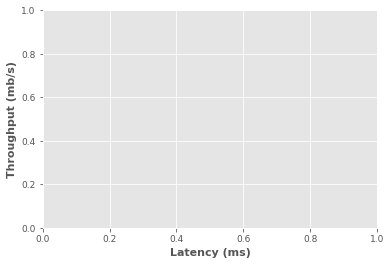

In [161]:
plt.xlabel('Latency (ms)')
plt.ylabel('Throughput (mb/s)')
plt.plot(tr_data[:,0],tr_data[:,1],'bx')
plt.show()

In [ ]:
'''Anomaly detection using one SVM'''
from sklearn import svm

'''Using the same dataset'''

In [162]:
tr_data= np.nan_to_num(tr_data)

In [163]:
cv_data= np.nan_to_num(cv_data)

In [164]:
gt_data= np.nan_to_num(gt_data)

In [169]:
clf = svm.OneClassSVM(nu=0.05, kernel="rbf", gamma=0.1)
tr_data.reshape(-1, 1)
clf.fit(tr_data)

ValueError: Expected 2D array, got 1D array instead:
array=[ 135.3   135.98  132.1  ... 7680.43 7502.01 7653.98].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [170]:
pred = clf.predict(tr_data)

# inliers are labeled 1, outliers are labeled -1
normal = tr_data[pred == 1]
abnormal = tr_data[pred == -1]

NotFittedError: This OneClassSVM instance is not fitted yet. Call 'fit' with appropriate arguments before using this method.

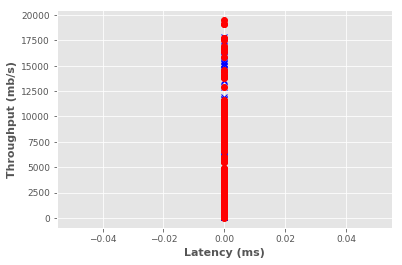

In [171]:
plt.figure()
plt.plot(normal[:,0],normal[:,1],'bx')
plt.plot(abnormal[:,0],abnormal[:,1],'ro')
plt.xlabel('Latency (ms)')
plt.ylabel('Throughput (mb/s)')
plt.show()